# Explainer examples

This notebook shows how you can use the `Explainer` object for interactive visualization in your jupyter notebook.

All this plotting functionality gets called by the `ExplainerDashboard` to construct the interactive dashboard.

# Imports

In [80]:
%load_ext autoreload
%autoreload 0

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [3]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

In [4]:
from explainerdashboard.explainers import *
from explainerdashboard.datasets import *

# ClassifierExplainer:

In [5]:
X_train, y_train, X_test, y_test = titanic_survive()
train_names, test_names = titanic_names()

feature_descriptions = {
    "Sex": "Gender of passenger",
    "Deck": "The deck the passenger had their cabin on",
    "PassengerClass": "The class of the ticket: 1st, 2nd or 3rd class",
    "Fare": "The amount of money people paid", 
    "No_of_relatives_on_board": "number of siblings, spouses, parents plus children on board",
    "Embarked": "the port where the passenger boarded the Titanic. Either Southampton, Cherbourg or Queenstown",
    "Age": "Age of the passenger",
    "No_of_siblings_plus_spouses_on_board": "The sum of the number of siblings plus the number of spouses on board",
    "No_of_parents_plus_children_on_board" : "The sum of the number of parents plus the number of children on board",
}

In [6]:
model = RandomForestClassifier(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

explainer = ClassifierExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'],
                                idxs=test_names, #names of passengers 
                                descriptions=feature_descriptions,
                                labels=['Not survived', 'Survived'])


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=5, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

Note: shap=='guess' so guessing for RandomForestClassifier shap='tree'...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Final note: You can always monkeypatch self.shap_explainer if desired...


## Importances

In [7]:
explainer.mean_abs_shap_df(cats=True, cutoff=0.01)

Calculating shap values...


,Feature,MEAN_ABS_SHAP
0,Sex,0.188940
1,Deck,0.058672
2,PassengerClass,0.040710
3,Fare,0.035076
4,Embarked,0.021637
5,No_of_relatives_on_board,0.013736
6,Age,0.010791


In [8]:
explainer.permutation_importances_df(cats=False, topx=12)

Calculating permutation importances...


,Feature,Importance
0,Fare,0.010355
2,Age,-0.009168
3,PassengerClass,0.020386
4,No_of_siblings_plus_spouses_on_board,-0.011865
5,No_of_parents_plus_children_on_board,-0.003236
6,Sex_female,0.049401
7,Sex_male,0.047999
8,Sex_nan,0.000000
9,Deck_A,-0.002643
10,Deck_B,-0.005501


### Mean absolute shap importances, grouping onehotencoded:

In [9]:
explainer.plot_importances(kind='shap', topx=5, cats=True, round=3)

### Permutation importances, not grouping categorical vars, showing top 10

In [10]:
explainer.plot_importances(kind='permutation', topx=10, cats=False, round=3)

## detailed shap summary

In [11]:
explainer.plot_shap_summary(topx=10, cats=True)

In [12]:
explainer.plot_shap_summary(topx=None, cats=False)

## interaction importances

### mean absolute shap interaction values for interactions with 'Sex' 
- the direct effect is usually the largest
- in this case PassengerClass shows the biggest interaction with gender

In [13]:
explainer.plot_interactions('Sex', cats=True, topx=5)

Calculating shap interaction values...


In [14]:
explainer.plot_interactions('Fare', cats=False, topx=5)

### Detailed shap interactions summary:

In [15]:
explainer.plot_shap_interaction_summary("Sex")

## Contributions

In [16]:
index = 0 # explain prediction for first row of X_test
explainer.contrib_df(index, cats=True, topx=8)

,col,contribution,value,cumulative,base
0,_BASE,0.389059,,0.389059,0
1,Sex,0.286515,female,0.675575,0.389059
2,Deck,0.0748919,C,0.750466,0.675575
3,Fare,0.0670519,71.2833,0.817518,0.750466
4,PassengerClass,0.059365,1,0.876883,0.817518
5,Embarked,0.0434233,Cherbourg,0.920307,0.876883
6,No_of_relatives_on_board,0.0110627,1,0.931369,0.920307
7,No_of_siblings_plus_spouses_on_board,0.00717433,1,0.938544,0.931369
8,No_of_parents_plus_children_on_board,0.00444601,0,0.94299,0.938544
9,_REST,-0.00214042,,0.940849,0.94299


In [17]:
explainer.plot_shap_contributions(index, cats=True, topx=8, round=2)

In [18]:
name = test_names[6] # explainer prediction for name
print(name)
explainer.plot_shap_contributions(name, cats=False)

Vestrom, Miss. Hulda Amanda Adolfina


In [19]:
explainer.plot_shap_contributions(name, cats=False, topx=10, sort='high-to-low', orientation='horizontal')

## Shap dependence plots

In [20]:
explainer.plot_shap_dependence("Age")

### color by sex

In [21]:
explainer.plot_shap_dependence("Age", color_col="Sex")

### color by Fare

In [22]:
explainer.plot_shap_dependence("Age", color_col="Fare")

### Highlight particular index

In [23]:

explainer.plot_shap_dependence("Age", color_col="Sex", highlight_index=5)

## Shap interactions plots

In [24]:
explainer.plot_shap_interaction("Sex", "PassengerClass")

In [25]:
explainer.plot_shap_interaction("PassengerClass", "Sex")

In [26]:
explainer.plot_shap_interaction("Fare", "Age", highlight_index=name)

In [27]:
explainer.plot_shap_interaction("Age", "Fare")

## partial dependence plots (pdp)

### Plot average general partial dependence plot with ice lines for specific observations

In [28]:
explainer.plot_pdp("Fare")

In [29]:
explainer.plot_pdp("Sex")

### highlight pdp for specific observation

In [30]:
name = test_names[5]
print(name)
explainer.plot_pdp("Fare", name)

Saundercock, Mr. William Henry
Calculating prediction probabilities...


### with default parameters:

In [31]:
explainer.plot_pdp("Age", index=5, drop_na=True, sample=100,
                    gridlines=100, gridpoints=10)

### adjusting parameters:

- `drop_na=False` no longer drop values equal to self.na_fill (-999 by default)
- `sample=200` sample 200 samples for calculating the average
- `gridlines=10`  display 10 additional grid lines
- `gridpoints=50` take 50 points along the x axis to calculate the lines

In [33]:
explainer.plot_pdp("Age", index=5, drop_na=False, sample=200,
                    gridlines=10, gridpoints=50)

## Classification validation plots:

In [34]:
explainer.metrics(cutoff=0.8)

{'accuracy': 0.745,
 'precision': 1.0,
 'recall': 0.3013698630136986,
 'f1': 0.4631578947368421,
 'roc_auc_score': 0.8732067738108079,
 'pr_auc_score': 0.8594383008090088,
 'log_loss': 0.4116487028378783}

In [35]:
from IPython.display import display, Markdown
display(Markdown(explainer.prediction_result_markdown(test_names[3])))

Calculating pred_percentiles...


Outcome: Survived

Prediction probabilities per label:

* Not survived: 48.29%
* Survived: 51.71%

In top 27.0% percentile probability Survived

### confusion matrix

In [36]:
explainer.plot_confusion_matrix(cutoff=0.5, normalized=False, binary=True)

#### For multiclass classifiers, `binary=False` would display e.g. a 3x3 confusion matrix
- in this case it's a binary classifier, so binary=False makes no difference

In [37]:
explainer.plot_confusion_matrix(cutoff=0.5, normalized=True, binary=False)

### precision plot
- if the classifier works well the predicted probability should be the same as the observed probability per bin, so we would expect a nice straight line from 0 to 1

#### based on bin size:

In [38]:
explainer.plot_precision(bin_size=0.1)

#### based on quantiles, showing all classes, adding in a cutoff value

In [39]:
explainer.plot_precision(quantiles=10, cutoff=0.75, multiclass=True)

### Cumulative precision

In [40]:
explainer.plot_cumulative_precision()

### lift curve

In [41]:
explainer.plot_lift_curve(cutoff=None, percentage=False, round=2)

In [42]:
explainer.plot_lift_curve(cutoff=0.75, percentage=True, round=2)

### Plot classification:

In [43]:
explainer.plot_classification()

In [44]:
explainer.plot_classification(cutoff=0.75, percentage=False)

### ROC AUC Curve

In [45]:
explainer.plot_roc_auc(cutoff=0.75)

### Plot PR AUC

In [46]:
explainer.plot_pr_auc(cutoff=0.25)

# RegressionExplainer

In [47]:
X_train, y_train, X_test, y_test = titanic_fare()
train_names, test_names = titanic_names()

feature_descriptions = {
    "Sex": "Gender of passenger",
    "Deck": "The deck the passenger had their cabin on",
    "PassengerClass": "The class of the ticket: 1st, 2nd or 3rd class",
    "Fare": "The amount of money people paid", 
    "No_of_relatives_on_board": "number of siblings, spouses, parents plus children on board",
    "Embarked": "the port where the passenger boarded the Titanic. Either Southampton, Cherbourg or Queenstown",
    "Age": "Age of the passenger",
    "No_of_siblings_plus_spouses_on_board": "The sum of the number of siblings plus the number of spouses on board",
    "No_of_parents_plus_children_on_board" : "The sum of the number of parents plus the number of children on board",
}

In [48]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

explainer = RegressionExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'], 
                                idxs=test_names, 
                                units="$")

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=5, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=50, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

Note: shap=='guess' so guessing for RandomForestRegressor shap='tree'...
Generating self.shap_explainer = shap.TreeExplainer(model)


## Importances

### Mean absolute shap importances, grouping onehotencoded:

In [49]:
explainer.plot_importances(kind='shap', topx=5, cats=True, round=3)

Calculating shap values...


### Permutation importances, not grouping categorical vars, showing top 10

In [50]:
explainer.plot_importances(kind='permutation', topx=10, cats=False, round=3)

Calculating importances...


## detailed shap summary

In [51]:
explainer.plot_shap_summary(topx=10, cats=True)

Calculating shap values...


In [52]:
explainer.plot_shap_summary(topx=None, cats=False)

## interaction importances

### mean absolute shap interaction values for interactions with 'Sex' 
- the direct effect is usually the largest
- in this case PassengerClass shows the biggest interaction with gender

In [53]:
explainer.plot_interactions('Sex', cats=True, topx=5)

Calculating shap interaction values...
Calculating shap interaction values...


In [54]:
explainer.plot_interactions('Age', cats=False, topx=5)

### Detailed shap interactions summary:

In [55]:
explainer.plot_shap_interaction_summary("Sex", cats=True)

## Contributions

In [56]:
index = 0 # explain prediction for first row of X_test
explainer.plot_shap_contributions(index, cats=True, topx=8, round=2)

In [57]:
name = test_names[0] # explainer prediction for name
print(name)
explainer.plot_shap_contributions(name, cats=False, sort='low-to-high', orientation='horizontal')

Cumings, Mrs. John Bradley (Florence Briggs Thayer)


## Shap dependence plots

In [58]:
explainer.plot_shap_dependence("Age")

### color by sex

In [59]:
explainer.plot_shap_dependence("Age", color_col="Sex")

### color by PassengerClass

In [60]:
explainer.plot_shap_dependence("Age", color_col="PassengerClass")

### Highlight particular index

In [61]:

explainer.plot_shap_dependence("Age", color_col="Sex", highlight_index=5)

## Shap interactions plots

In [62]:
explainer.plot_shap_interaction("Sex", "PassengerClass")

In [63]:
explainer.plot_shap_interaction("PassengerClass", "Sex")

In [65]:
explainer.plot_shap_interaction("PassengerClass", "Age", highlight_index=5)

In [66]:
explainer.plot_shap_interaction("Age", "PassengerClass")

## partial dependence plots (pdp)

### Plot average general partial dependence plot with ice lines for specific observations

In [67]:
explainer.plot_pdp("PassengerClass")

In [68]:
explainer.plot_pdp("Deck")

### highlight pdp for specific observation

In [69]:
name = test_names[17]
print(name)
explainer.plot_pdp("PassengerClass", name)

Hood, Mr. Ambrose Jr
Calculating predictions...


### with default parameters:

In [70]:
explainer.plot_pdp("PassengerClass", index=17, drop_na=True, sample=100,
                    gridlines=100, gridpoints=10)

### adjusting parameters:

- `drop_na=False` no longer drop values equal to self.na_fill (-999 by default)
- `sample=200` sample 200 samples for calculating the average
- `gridlines=10`  display 10 additional grid lines
- `gridpoints=50` take 50 points along the x axis to calculate the lines

In [71]:
explainer.plot_pdp("PassengerClass", index=17, drop_na=False, sample=200,
                    gridlines=10, gridpoints=50)

## Regression validation plots:

In [72]:
explainer.metrics()

{'rmse': 28.365206587493486,
 'mae': 12.400162806118932,
 'R2': 0.4493207254530014}

In [73]:
from IPython.display import display, Markdown
display(Markdown(explainer.prediction_result_markdown(test_names[3])))

Calculating residuals...


Prediction: 18.38 $

Actual: 11.13 $

Residual: -7.24 $

### predicted vs actual

In [74]:
explainer.plot_predicted_vs_actual()

In [75]:
explainer.plot_predicted_vs_actual(log_x=True, log_y=True)

### plot residuals

In [81]:
explainer.plot_residuals()

In [82]:
explainer.plot_residuals(vs_actual=True, residuals='ratio')

In [83]:
explainer.plot_residuals(vs_actual=True, residuals='log-ratio')

### residuals vs specific feature

In [84]:
explainer.plot_residuals_vs_feature("Age")

# RandomForestExplainer

`RandomForestClassifierExplainer`. and `RandomForestRegressionExplainer`, provide some additional functionality to visualize the individual trees in the RandomForest.

In [85]:
X_train, y_train, X_test, y_test = titanic_survive()
train_names, test_names = titanic_names()

feature_descriptions = {
    "Sex": "Gender of passenger",
    "Deck": "The deck the passenger had their cabin on",
    "PassengerClass": "The class of the ticket: 1st, 2nd or 3rd class",
    "Fare": "The amount of money people paid", 
    "No_of_relatives_on_board": "number of siblings, spouses, parents plus children on board",
    "Embarked": "the port where the passenger boarded the Titanic. Either Southampton, Cherbourg or Queenstown",
    "Age": "Age of the passenger",
    "No_of_siblings_plus_spouses_on_board": "The sum of the number of siblings plus the number of spouses on board",
    "No_of_parents_plus_children_on_board" : "The sum of the number of parents plus the number of children on board",
}

from sklearn.ensemble import RandomForestRegressor
model = RandomForestClassifier(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

explainer = RandomForestClassifierExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'], 
                                idxs=test_names)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=5, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

Note: shap=='guess' so guessing for RandomForestClassifier shap='tree'...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Final note: You can always monkeypatch self.shap_explainer if desired...


In [86]:
name = test_names[20]
print(name)# first row of X_test
explainer.plot_trees(name, highlight_tree=20)

Christmann, Mr. Emil


In [87]:
explainer.decisiontree_df(tree_idx=20, index=name)

Generating ShadowDecTree for each individual decision tree...


,node_id,average,feature,value,split,direction,left,right,diff
0,0,0.397974,Sex_female,0.0,0.5,left,0.205689,0.773504,-0.192285
1,1,0.205689,Deck_Unkown,1.0,0.5,right,0.524390,0.136000,-0.069689
2,9,0.136000,Age,29.0,45.5,left,0.150888,0.000000,0.014888
3,10,0.150888,No_of_siblings_plus_spouses_on_board,0.0,2.5,left,0.160883,0.000000,0.009996
4,11,0.160883,Embarked_Queenstown,0.0,0.5,left,0.166102,0.090909,0.005218


In [88]:
decisiontree_df = explainer.decisiontree_summary_df(tree_idx=5, index=name)
decisiontree_df

,Feature,Condition,Adjustment,New Prediction
0,,,Starting average,39.65%
1,Sex_female,0.0 < 0.5,-18.94%,20.71%
2,No_of_parents_plus_children_on_board,0.0 < 0.5,-2.7%,18.02%
3,Deck_B,0.0 < 0.5,-0.17%,17.85%
4,Deck_C,0.0 < 0.5,-1.55%,16.3%
5,Deck_Unkown,1.0 >= 0.5,-4.44%,11.85%
6,,,Final Prediction,11.85%


## decision_path
- this graphic is generated by dtreeviz
- See https://explained.ai/decision-tree-viz/index.html for more of the thinking behind this visualization
- dtreeviz generates an SVG gile that gets saved to disk
- but you need a working installation of graphviz for this to work
- Would be nice to turn this into a react component!


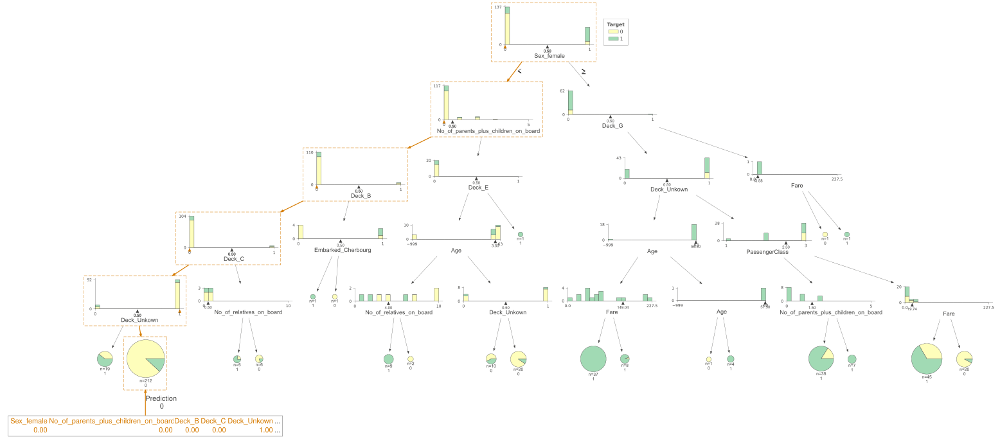

In [89]:
explainer.decision_path(tree_idx=5, index=name)